In [7]:
!pip install git+https://github.com/facebookresearch/segment-anything.git
!pip install opencv-python pycocotools matplotlib torch torchvision

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-0u3170uy
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-0u3170uy
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Using cached nvidia_cusolver_cu12-11.6.1.9-py3-none-manylinux2014_x86_64.whl.metadata (1.6 kB)
Using cached nvidia_cusolver_cu12-11.6.1.9-py3-none-manylinux2014_x86_64.whl (127.9 MB)
  Attempting uninstall: nvidia-cusolver-cu12
    Found existing installation: nvidia-cusolver-cu12 11.7.3.90
    Uninstalling nvidia-cusolver-cu12-11.7.3.90:
      Successfully uninstalled nvidia-cusolver-cu12-11.7.3.90
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pylibcugraph-cu12 24.1

In [8]:
!wget https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth -O sam_vit_h_4b8939.pth

--2025-04-18 10:07:41--  https://dl.fbaipublicfiles.com/segment_anything/sam_vit_h_4b8939.pth
Resolving dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)... 13.227.219.10, 13.227.219.33, 13.227.219.59, ...
Connecting to dl.fbaipublicfiles.com (dl.fbaipublicfiles.com)|13.227.219.10|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 2564550879 (2.4G) [binary/octet-stream]
Saving to: ‘sam_vit_h_4b8939.pth’

sam_vit_h_4b8939.pt 100%[===================>]   2.39G   282MB/s    in 8.6s    

2025-04-18 10:07:50 (286 MB/s) - ‘sam_vit_h_4b8939.pth’ saved [2564550879/2564550879]



In [15]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
from segment_anything import SamPredictor, sam_model_registry, SamAutomaticMaskGenerator
import torch
import os
import random
import urllib
import requests
import json

In [12]:
model_type = "vit_h"  # Using the largest model for best results
checkpoint_path = "sam_vit_h_4b8939.pth"

# Load the model
sam = sam_model_registry[model_type](checkpoint=checkpoint_path)
sam.to(device='cuda' if torch.cuda.is_available() else 'cpu')
predictor = SamPredictor(sam)


/usr/local/lib/python3.11/dist-packages/segment_anything/build_sam.py:105: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state_dict = torch.load(f)


In [13]:
# Utility function to load an image from a URL
def load_image_from_url(image_url, readFlag=cv2.IMREAD_COLOR):
    try:
        response = requests.get(image_url, stream=True)
        response.raise_for_status()
        arr = np.asarray(bytearray(response.content), dtype=np.uint8)
        img = cv2.imdecode(arr, readFlag)
        if img is None:
            raise ValueError("Failed to decode image from URL")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        return img
    except Exception as e:
        print(f"Error fetching image from URL: {e}")
        return None

# Utility function to load an image from a local path
def load_image(image_path):
    image = cv2.imread(image_path)
    if image is None:
        print(f"Failed to load image from path: {image_path}")
        return None
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

# Utility function to extract bounding boxes from masks
def get_bounding_boxes(masks, image_shape, confidence_threshold=0.01):
    objects = {}
    object_id = 1
    for mask in masks:
        mask_array = mask['segmentation']
        mask_uint8 = (mask_array * 255).astype(np.uint8)
        contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        for contour in contours:
            area = cv2.contourArea(contour)
            if area > confidence_threshold * image_shape[0] * image_shape[1]:
                x, y, w, h = cv2.boundingRect(contour)
                objects[str(object_id)] = {"x": int(x), "y": int(y), "w": int(w), "h": int(h)}
                object_id += 1
    result = {"width": int(image_shape[1]), "height": int(image_shape[0]), "objects": objects}
    return result

# Utility function to draw segmentation masks on the image
def draw_segmentation_masks(image, masks, bounding_box_data):
    image_copy = image.copy()
    overlay = np.zeros_like(image, dtype=np.uint8)
    sorted_masks = sorted(masks, key=lambda m: -np.sum(m['segmentation']))
    for obj_id, bbox in bounding_box_data["objects"].items():
        x, y, w, h = bbox["x"], bbox["y"], bbox["w"], bbox["h"]
        for mask in sorted_masks:
            mask_array = mask['segmentation']
            mask_uint8 = (mask_array * 255).astype(np.uint8)
            contours, _ = cv2.findContours(mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
            for contour in contours:
                mx, my, mw, mh = cv2.boundingRect(contour)
                if mx == x and my == y and mw == w and mh == h:
                    color = (random.randint(0, 255), random.randint(0, 255), random.randint(0, 255))
                    overlay[mask_array] = color
                    cv2.putText(image_copy, f"ID: {obj_id}", (x, y-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1)
                    break
    alpha = 0.8
    result_image = cv2.addWeighted(image_copy, 1.0 - alpha, overlay, alpha, 0.0)
    return result_image

# Utility function to draw bounding boxes on the image
def draw_bounding_boxes(image, bounding_box_data):
    image_copy = image.copy()
    for obj_id, bbox in bounding_box_data["objects"].items():
        x, y, w, h = bbox["x"], bbox["y"], bbox["w"], bbox["h"]
        cv2.rectangle(image_copy, (x, y), (x + w, y + h), (255, 0, 0), 2)
    return image_copy

# Main plotting function
def plot_image_with_segmentation(image_source, confidence_threshold=0.01, output_dir='output'):
    """
    Process and visualize segmentation masks and bounding boxes for a single image.
    
    Parameters:
    - image_source (str): URL or local path to the image
    - confidence_threshold (float): Minimum area threshold for object detection (default: 0.01)
    - output_dir (str): Directory to save output files (default: 'output')
    """
    # Load the image based on source type
    if image_source.startswith('http'):
        image = load_image_from_url(image_source)
    else:
        image = load_image(image_source)
    
    if image is None:
        print("Failed to load image.")
        return
    
    # Generate segmentation masks
    mask_generator = SamAutomaticMaskGenerator(sam)
    masks = mask_generator.generate(image)
    
    # Extract bounding boxes
    bounding_box_data = get_bounding_boxes(masks, image.shape, confidence_threshold)
    
    # Visualize segmentation masks
    result_image_masks = draw_segmentation_masks(image, masks, bounding_box_data)
    
    # Visualize bounding boxes
    result_image_bboxes = draw_bounding_boxes(image, bounding_box_data)
    
    # Display the results
    plt.figure(figsize=(10, 10))
    plt.imshow(result_image_masks)
    plt.axis('off')
    plt.title(f"Segmentation Masks (Threshold: {confidence_threshold})")
    plt.show()
    
    plt.figure(figsize=(10, 10))
    plt.imshow(result_image_bboxes)
    plt.axis('off')
    plt.title(f"Objects with Bounding Boxes (Threshold: {confidence_threshold})")
    plt.show()
    
    # Print number of objects detected
    print(f"Number of objects detected: {len(bounding_box_data['objects'])}")
    
    # Generate output file names based on image source
    base_name = image_source.split('/')[-1].split('.')[0] if image_source.startswith('http') else os.path.basename(image_source).split('.')[0]
    output_image_path = os.path.join(output_dir, f"{base_name}_with_bboxes.jpg")
    output_json_path = os.path.join(output_dir, f"{base_name}_bounding_boxes.json")
    
    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)
    
    # Save image with bounding boxes
    cv2.imwrite(output_image_path, cv2.cvtColor(result_image_bboxes, cv2.COLOR_RGB2BGR))
    print(f"Result saved to {output_image_path}")
    
    # Save bounding box data as JSON
    with open(output_json_path, 'w') as f:
        json.dump(bounding_box_data, f, indent=4)
    print(f"Bounding box data saved to {output_json_path}")
 

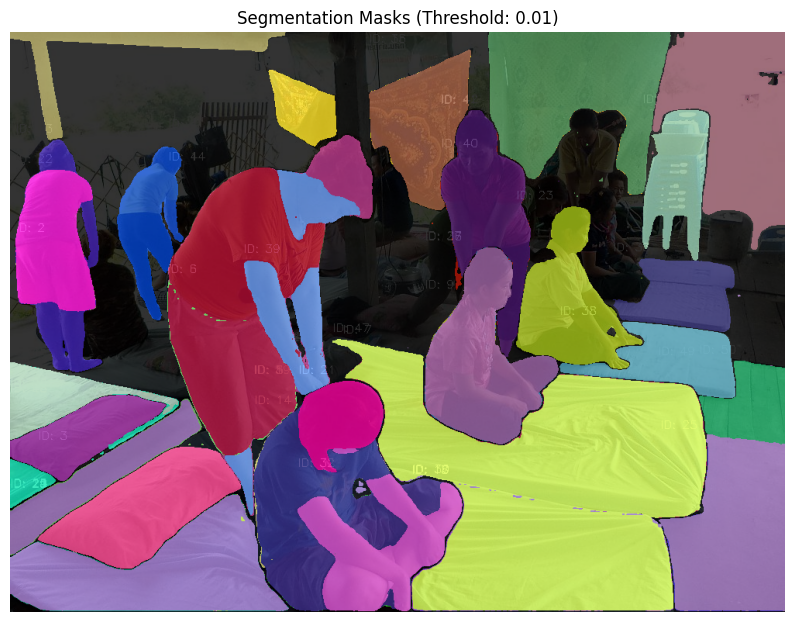

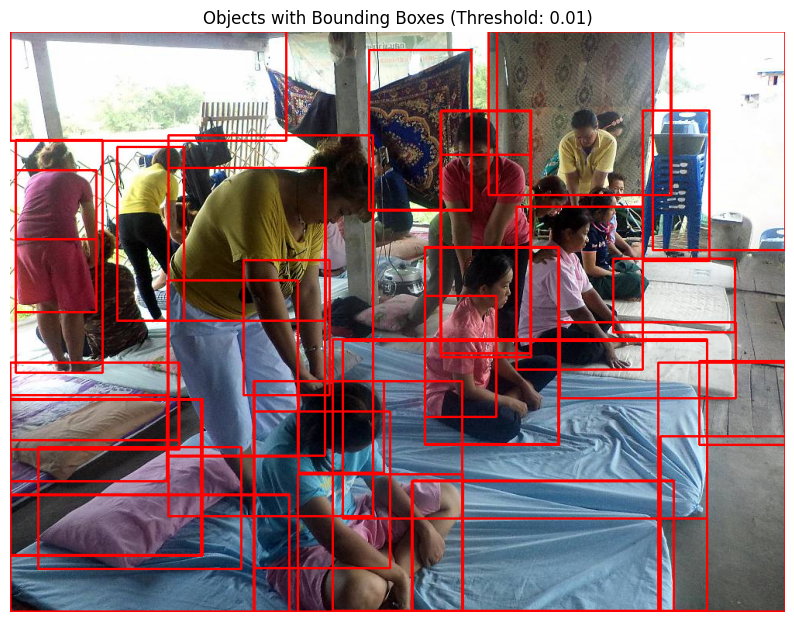

Number of objects detected: 50
Result saved to results/12436-HUG_with_bboxes.jpg
Bounding box data saved to results/12436-HUG_bounding_boxes.json


In [16]:
plot_image_with_segmentation("https://ich.unesco.org/img/photo/thumb/12436-HUG.jpg", confidence_threshold=0.01, output_dir='results')

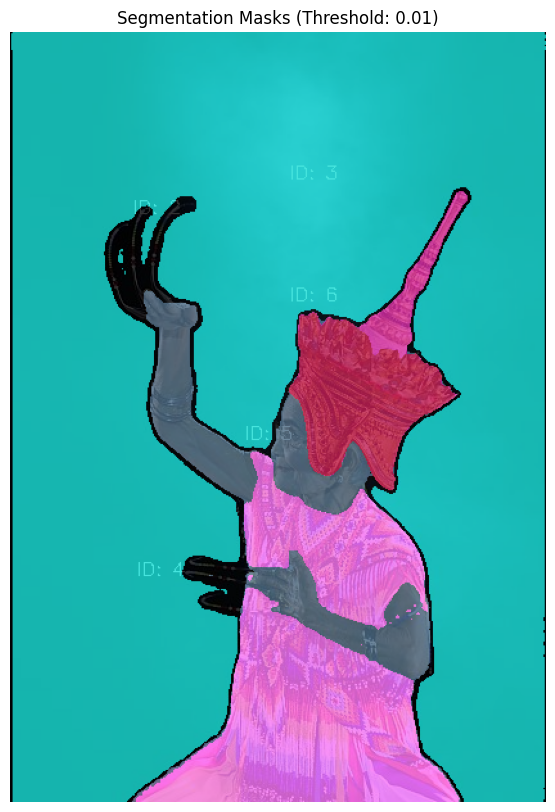

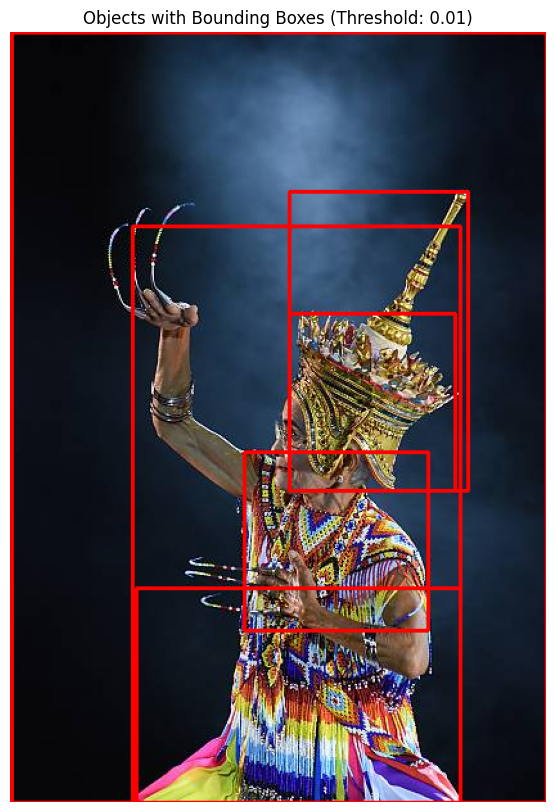

Number of objects detected: 6
Result saved to results/14181-BIG_with_bboxes.jpg
Bounding box data saved to results/14181-BIG_bounding_boxes.json


In [17]:
plot_image_with_segmentation("https://ich.unesco.org/img/photo/thumb/14181-BIG.jpg", confidence_threshold=0.01, output_dir='results')

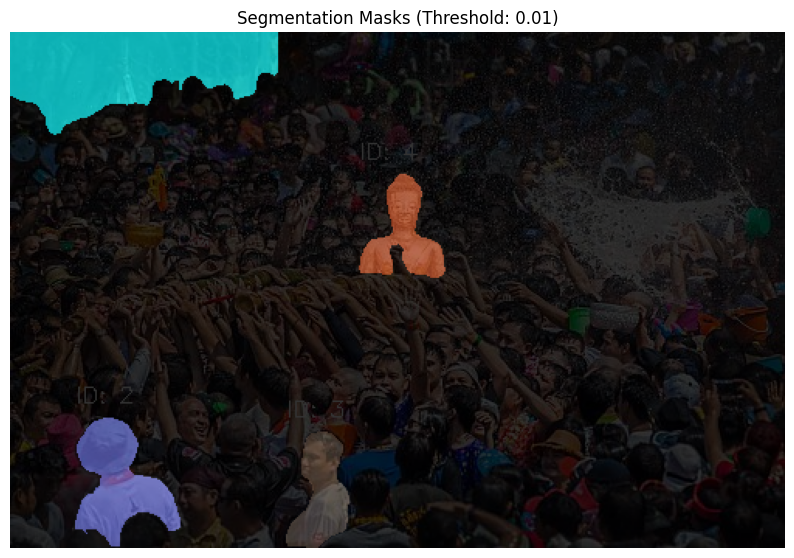

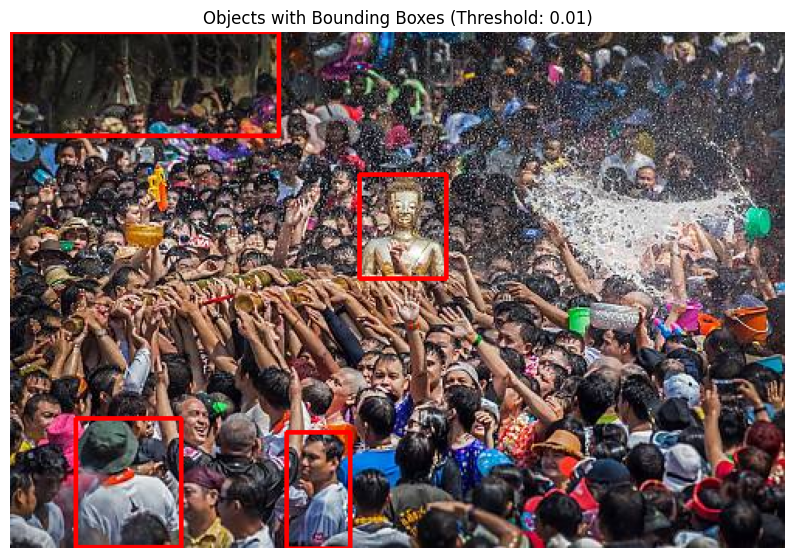

Number of objects detected: 4
Result saved to results/15310-BIG_with_bboxes.jpg
Bounding box data saved to results/15310-BIG_bounding_boxes.json


In [18]:
plot_image_with_segmentation("https://ich.unesco.org/img/photo/thumb/15310-BIG.jpg", confidence_threshold=0.01, output_dir='results')

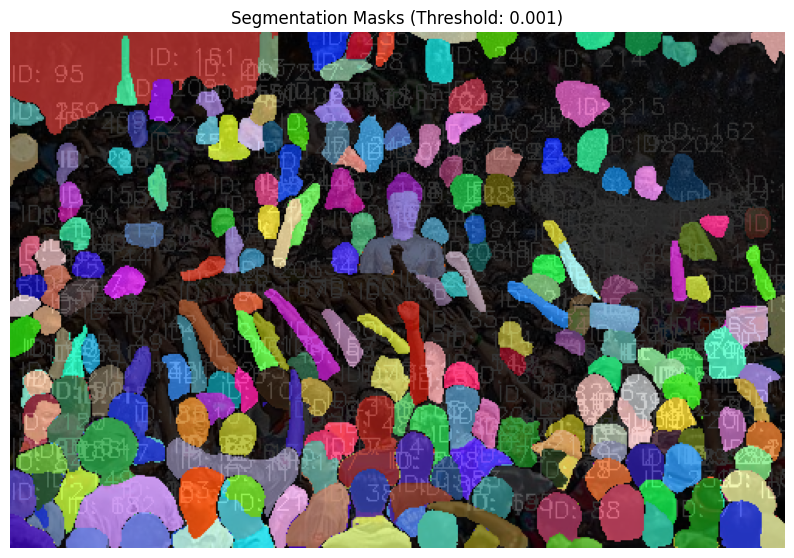

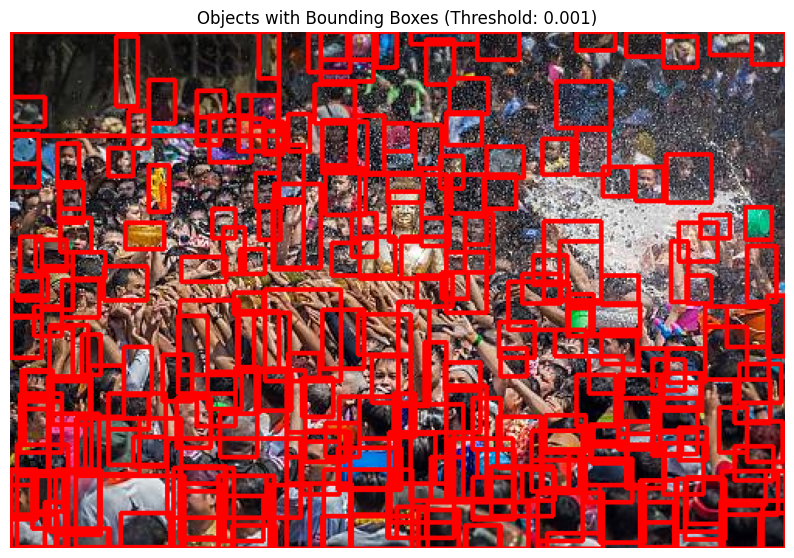

Number of objects detected: 260
Result saved to results/15310-BIG_with_bboxes.jpg
Bounding box data saved to results/15310-BIG_bounding_boxes.json


In [23]:
plot_image_with_segmentation("https://ich.unesco.org/img/photo/thumb/15310-BIG.jpg", confidence_threshold=0.001, output_dir='results')

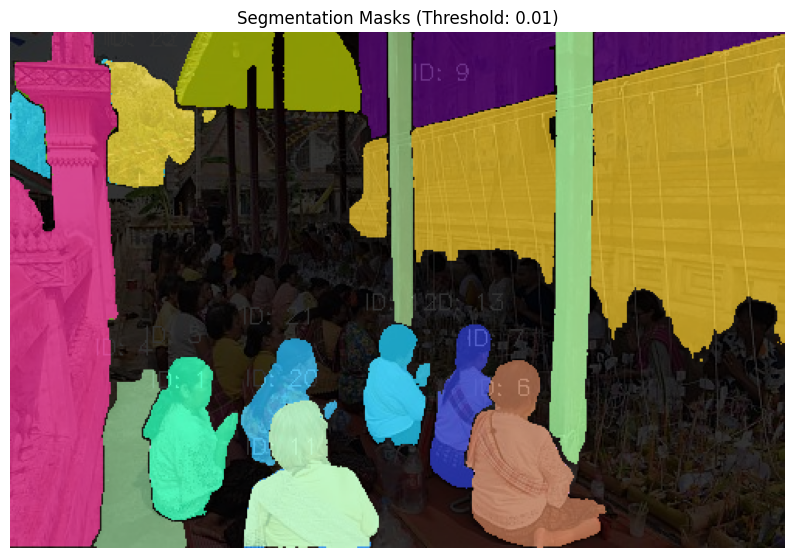

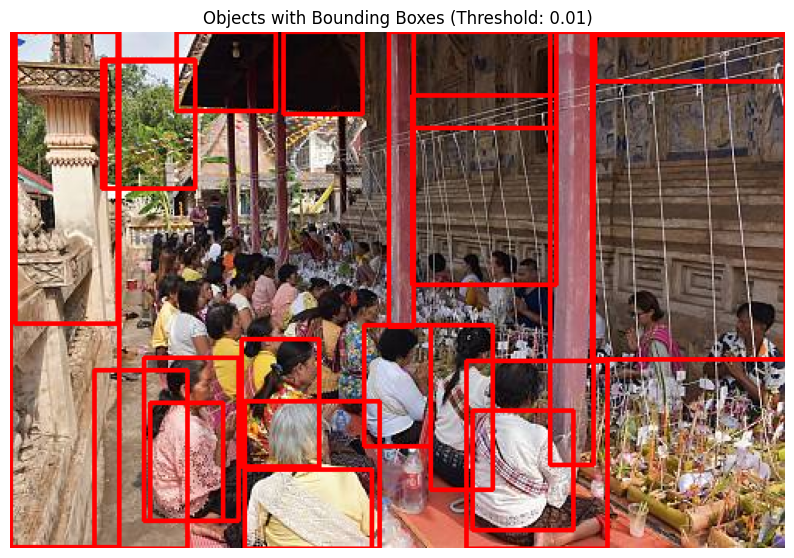

Number of objects detected: 22
Result saved to results/15309-BIG_with_bboxes.jpg
Bounding box data saved to results/15309-BIG_bounding_boxes.json


In [19]:
plot_image_with_segmentation("https://ich.unesco.org/img/photo/thumb/15309-BIG.jpg", confidence_threshold=0.01, output_dir='results')

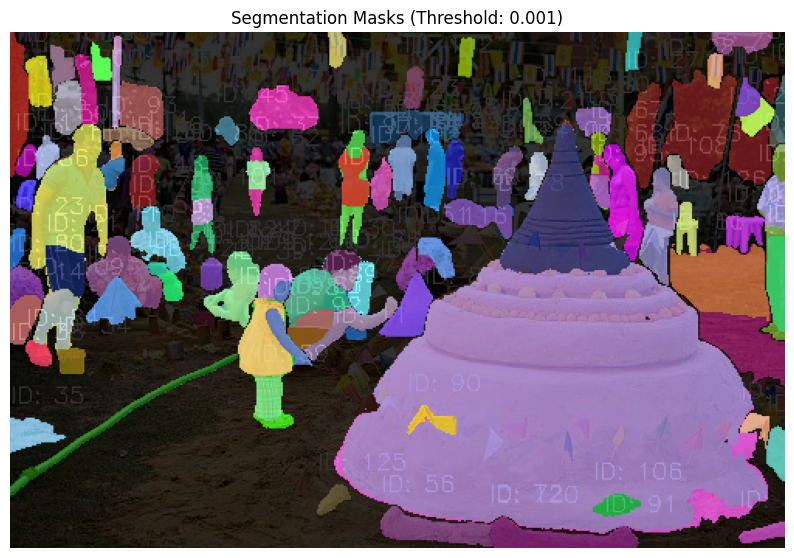

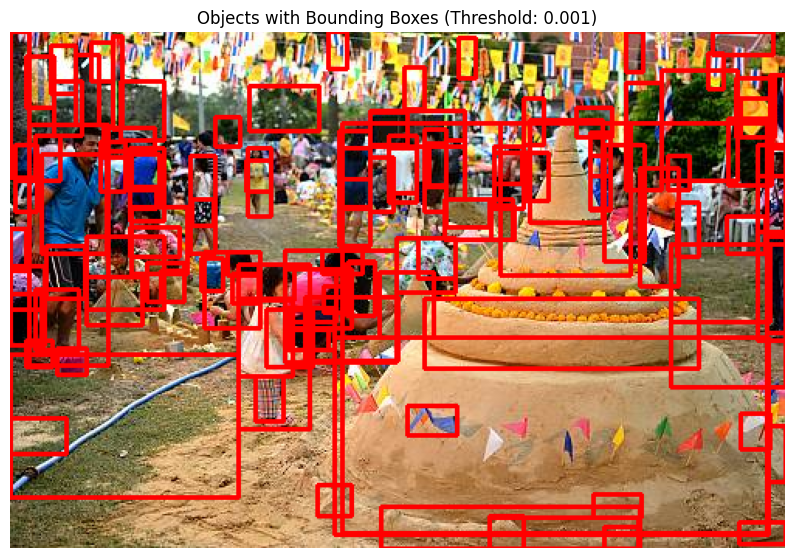

Number of objects detected: 126
Result saved to results/15316-BIG_with_bboxes.jpg
Bounding box data saved to results/15316-BIG_bounding_boxes.json


In [21]:
plot_image_with_segmentation("https://ich.unesco.org/img/photo/thumb/15316-BIG.jpg", confidence_threshold=0.001, output_dir='results')

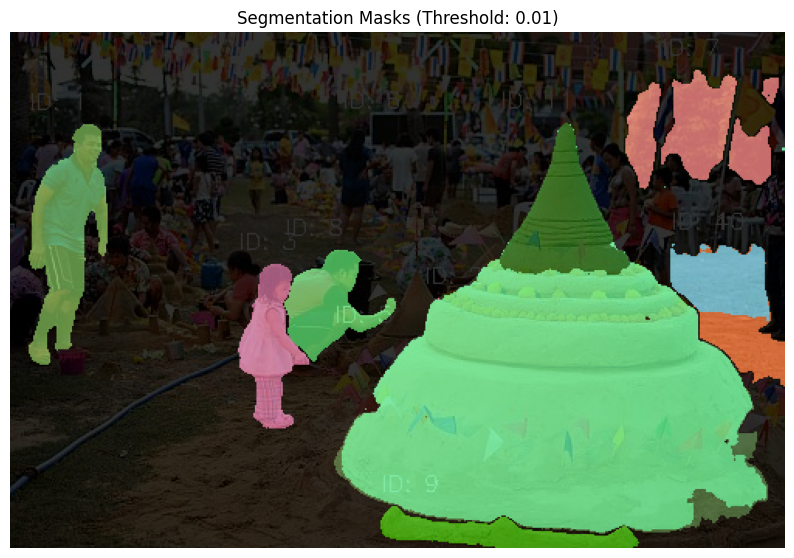

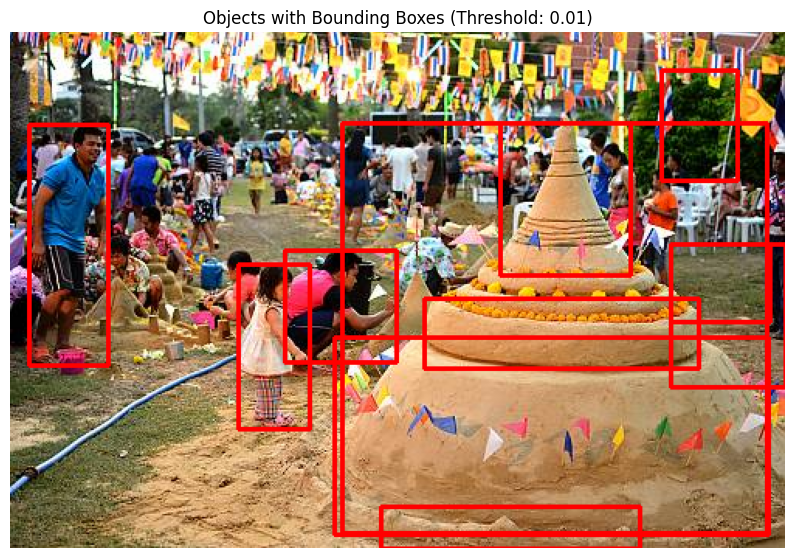

Number of objects detected: 11
Result saved to results/15316-BIG_with_bboxes.jpg
Bounding box data saved to results/15316-BIG_bounding_boxes.json


In [22]:
plot_image_with_segmentation("https://ich.unesco.org/img/photo/thumb/15316-BIG.jpg", confidence_threshold=0.01, output_dir='results')